# TP02 : Filtrage

In [50]:
import cv2 as cv
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

## 1. Lire une image A.

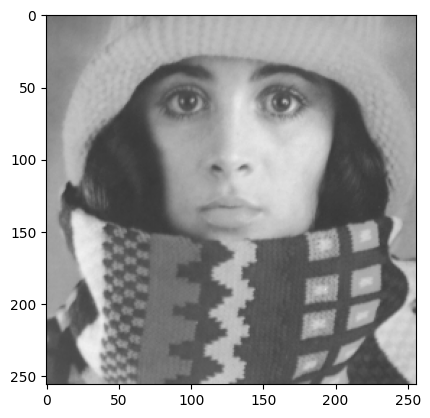

In [51]:
A = cv.imread('./trui.png')
plt.imshow(A)
plt.show()

In [4]:
# Convertir l'image en niveaux de gris (reduire la dimension de l'image à 2)
A_gris = cv.cvtColor(A, cv.COLOR_BGR2GRAY)

## 2. Ajouter un bruit à A du type poivre et sel, puis un bruit gaussien.

### - Bruit Impulsionnel (poivre et sel)

On sélectionne aléatoirement des pixels, et on les met en noir ou blanc.

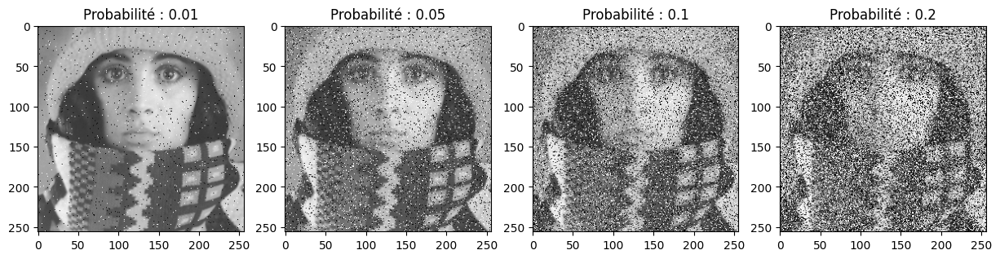

In [5]:
# Les probabilités à tester
probs = [0.01, 0.05, 0.1, 0.2]

fig, axs = plt.subplots(1, len(probs), figsize=(15, 5))

for i, prob in enumerate(probs):
    # création d'un bruit aléatoire
    noise = np.zeros_like(A_gris)
    cv.randu(noise, 0, 255)
    
    # création du masque pour le sel et le poivre
    salt = noise > 255 - 255 * prob
    pepper = noise < 255 * prob
    
    # ajout du bruit à l'image d'origine
    A_noise = np.copy(A_gris)
    A_noise[salt] = 255
    A_noise[pepper] = 0
    
    # affichage de l'image 
    axs[i].imshow(A_noise, cmap="gray")
    axs[i].set_title(f"Probabilité : {prob}")

# affichage de la figure
plt.show()

##### Pour zoomer sur les pixels : 

- C'est possible de voir les valeurs de chaque pixel en faisant un zoom.
- Pour quitter la fenêtre, appuyez sur n'importe quelle touche de clavier. Ne cliquez pas sur **x**.

In [57]:
noise = np.zeros_like(A_gris)
cv.randu(noise, 0, 255)
salt = noise > 255 - 255 * 0.05
pepper = noise < 255 * 0.05
A_ps = A_gris.copy()
A_ps[salt] = 255
A_ps[pepper] = 0
cv.imshow('Bruit poivre et sel', A_ps)
cv.waitKey(0)
cv.destroyAllWindows()

### - Bruit Gaussien

- **Variance = 0.1**

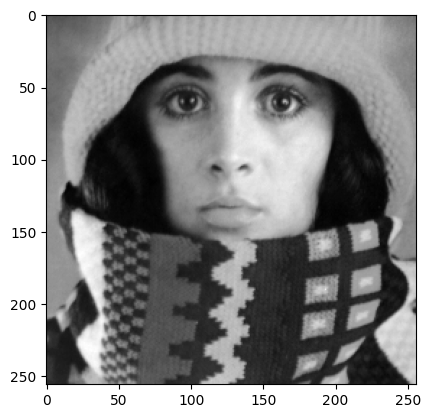

In [7]:
# Générer du bruit gaussien
mean = 0
variance = 0.1
sigma = np.sqrt(variance)
gaussian = np.random.normal(mean, sigma, A_gris.shape)

# Ajouter le bruit à l'image
noisy_img = A_gris + gaussian

plt.imshow(noisy_img,cmap="gray")
plt.show()

Le bruit n'a pas eu d'effet sur l'image, car la variance est très faible. On peut résoudre ce problème de deux façons :
1. Normalisation de l'image avant d'ajouter le bruit.
2. Augmenter la variance.

- **Normalisation**

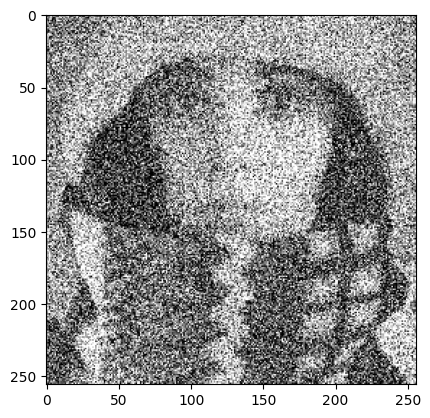

In [8]:
A_gris_norm = A_gris /255
# Générer du bruit gaussien
gaussian = np.random.normal(mean, sigma, A_gris_norm.shape)

# Ajouter le bruit à l'image
noisy_img = A_gris_norm + gaussian
noisy_img = np.clip(noisy_img, 0, 1) * 255

plt.imshow(noisy_img,cmap="gray")
plt.show()

- **Augmenter la variance**

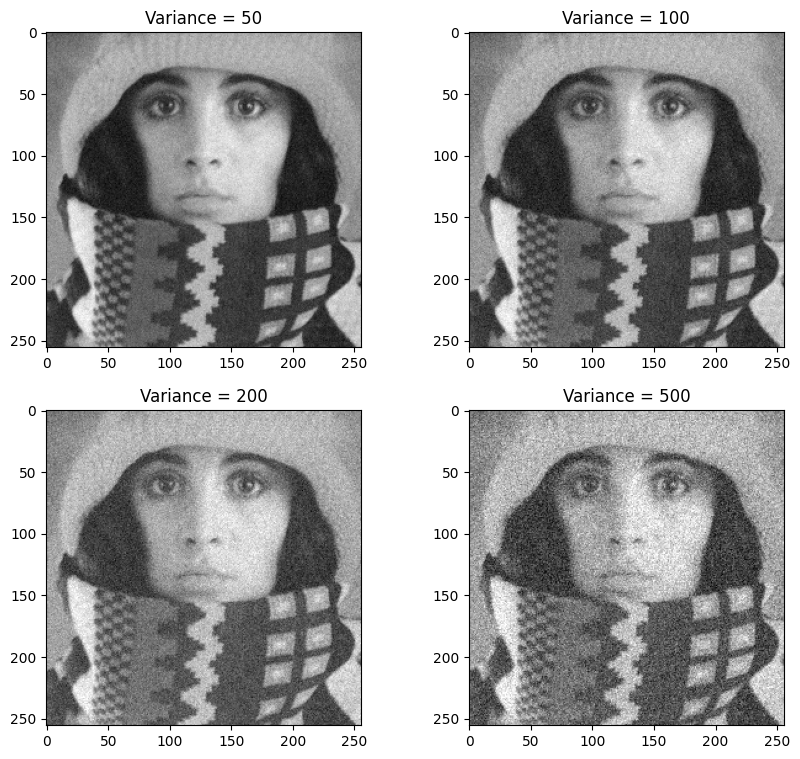

In [15]:
# create subplots
fig, axs = plt.subplots(2, 2, figsize=(10, 9))

# try different variances
variances = [50, 100, 200,500]

for i, variance in enumerate(variances):
    # generate Gaussian noise
    mean = 0
    sigma = np.sqrt(variance)
    gaussian = np.random.normal(mean, sigma, A_gris.shape)

    # add the noise to the image
    noisy_img = A_gris + gaussian

    # clip the noisy image to [0, 255]
    noisy_img = np.clip(noisy_img, 0, 255)

    # plot the noisy image
    row = i // 2
    col = i % 2
    axs[row, col].imshow(noisy_img, cmap="gray")
    axs[row, col].set_title(f"Variance = {variance}")

gaussian = np.random.normal(0, np.sqrt(200), A_gris.shape)
noisy_img = A_gris + gaussian

plt.show()

## 3. Filtrer ces deux images bruitées en utilisant les filtres vus en cours (filtre passe bas, médian ).

### - Filtre passe bas : $M_{pb_1}$

$$Mpb_1 = \frac{1}{9}\begin{pmatrix}
  1 & 1 & 1\\ 
  1 & 1 & 1\\
  1 & 1 & 1
\end{pmatrix}$$

In [16]:
Mpb1 = (1/9)*np.array([[1, 1, 1], [1, 1, 1], [1, 1, 1]])

### Sur l'image avec bruit gaussien : 

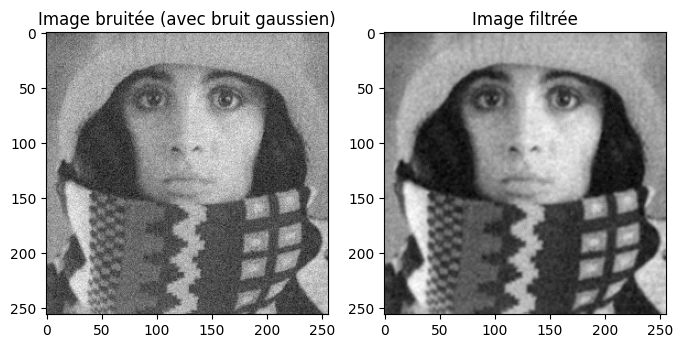

In [23]:
gaussian_filtered = cv.filter2D(noisy_img, -1, Mpb1)
fig, axs = plt.subplots(1, 2, figsize=(8, 8))

axs[0].imshow(noisy_img, cmap="gray")
axs[0].set_title("Image bruitée (avec bruit gaussien)")

axs[1].imshow(gaussian_filtered, cmap="gray")
axs[1].set_title("Image filtrée")

plt.show()

La fonction *filter2D* utilise la corrélation pour appliquer le filtre, essayons avec la convolution pour voir s'il y a une différence.

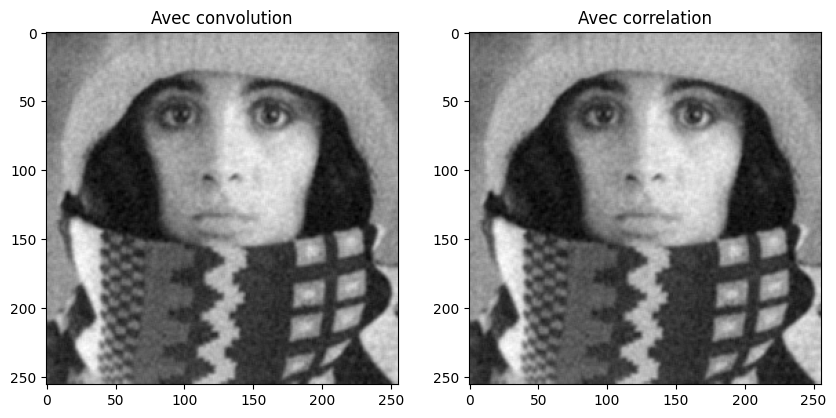

In [18]:
from scipy.signal import convolve2d

fig, axs = plt.subplots(1, 2, figsize=(10, 5))
# Apply the filter using convolution
result = convolve2d(noisy_img, Mpb1, mode='same', boundary='symm')

axs[0].imshow(result, cmap="gray")
axs[0].set_title("Avec convolution")

axs[1].imshow(gaussian_filtered, cmap="gray")
axs[1].set_title("Avec correlation")

plt.show()

Il n'y a pas de différence car le masque de notre filtre est symétrique.

### - Filtre passe bas : $M_{pb_2}$

$$Mpb_2 = \frac{1}{16}\begin{pmatrix}
  1 & 2 & 1\\ 
  2 & 4 & 2\\
  1 & 2 & 1
\end{pmatrix}$$

In [19]:
Mpb2 = (1/16)*np.array([[1, 2, 1], [2, 4, 2], [1, 2, 1]])

### Sur l'image avec bruit gaussien : 

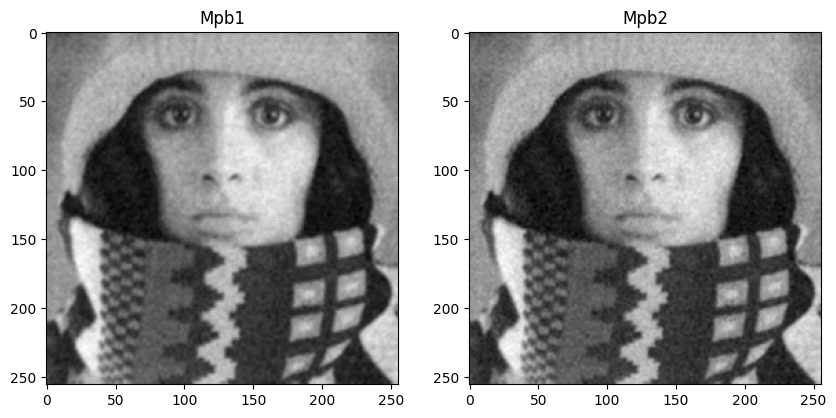

In [21]:
gaussian_filtered_2 = cv.filter2D(noisy_img, -1, Mpb2)
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

axs[0].imshow(gaussian_filtered, cmap="gray")
axs[0].set_title("Mpb1")

axs[1].imshow(gaussian_filtered_2, cmap="gray")
axs[1].set_title("Mpb2")

plt.show()

### Sur l'image avec bruit impulsionnel : 

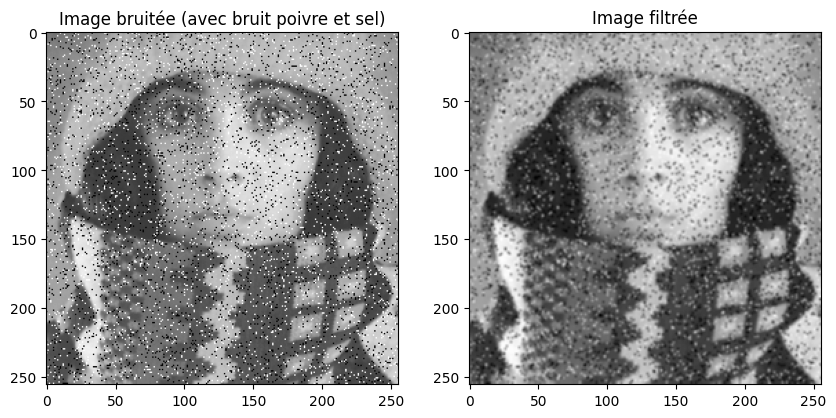

In [26]:
sel_poivre_filtered = cv.filter2D(A_ps, -1, Mpb2)
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

axs[0].imshow(A_ps, cmap="gray")
axs[0].set_title("Image bruitée (avec bruit poivre et sel)")

axs[1].imshow(sel_poivre_filtered, cmap="gray")
axs[1].set_title("Image filtrée")

plt.show()

## Filtre Mediane (De Tukey)

### Sur l'image avec bruit gaussien : 

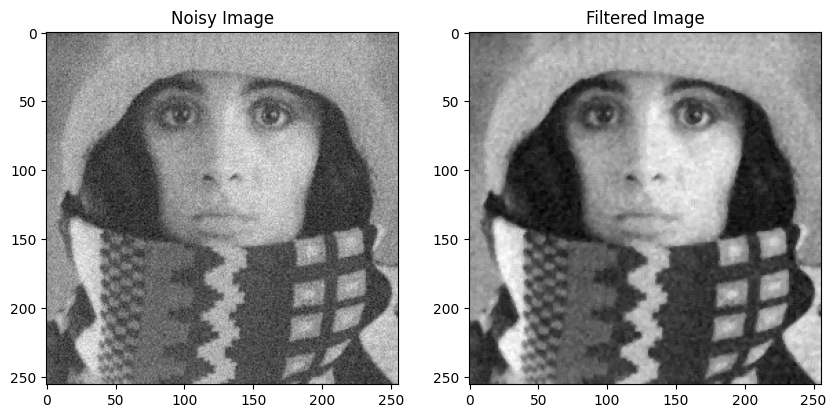

In [27]:
filtered_img = cv.medianBlur(noisy_img.astype(np.uint8), ksize=3)

# Display the images
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(noisy_img, cmap="gray")
axs[0].set_title("Noisy Image")
axs[1].imshow(filtered_img, cmap="gray")
axs[1].set_title("Filtered Image")
plt.show()

### Sur l'image avec bruit impulsionnel : 

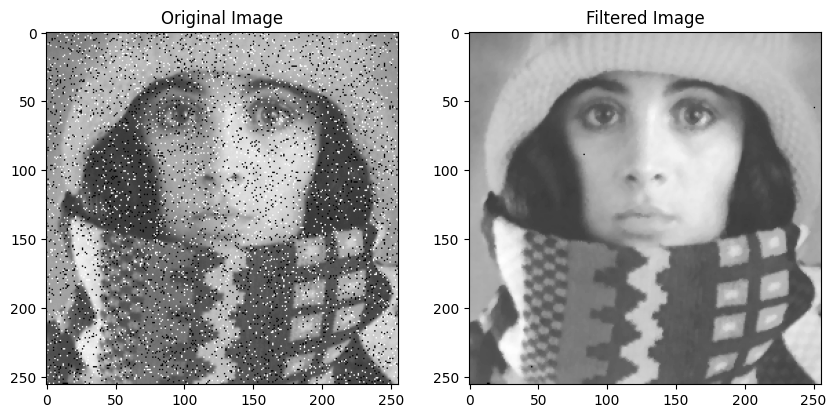

In [28]:
# apply Tukey filter (median filter)
filtered_img = cv.medianBlur(A_ps, ksize=3)

# display the original and filtered images
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(A_ps, cmap="gray")
axs[0].set_title("Original Image")
axs[1].imshow(filtered_img, cmap="gray")
axs[1].set_title("Filtered Image")
plt.show()

### Essayer des differents tailles de fenetres

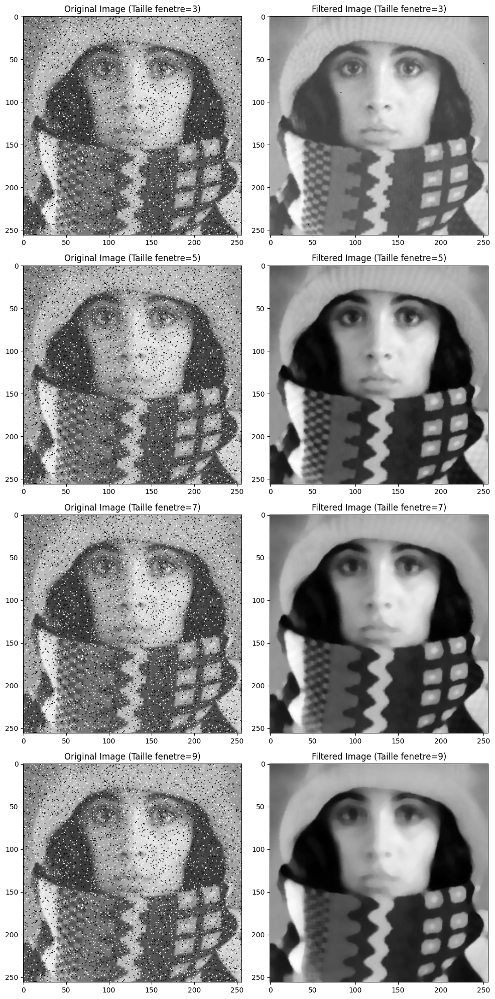

In [29]:
kernel_sizes = [3, 5, 7, 9]  # different kernel sizes to try

fig, axs = plt.subplots(len(kernel_sizes), 2, figsize=(10, 5*len(kernel_sizes)))

for i, ksize in enumerate(kernel_sizes):
    # apply Tukey filter (median filter)
    filtered_img = cv.medianBlur(A_ps, ksize=ksize)

    # display the original and filtered images
    axs[i, 0].imshow(A_ps, cmap="gray")
    axs[i, 0].set_title("Original Image (Taille fenetre={})".format(ksize))
    axs[i, 1].imshow(filtered_img, cmap="gray")
    axs[i, 1].set_title("Filtered Image (Taille fenetre={})".format(ksize))

plt.tight_layout()
plt.show()

### 4. Appliquer à A un filtre passe- haut avec et sans la moyenne. Afficher le résultat. Conclusions.

### - Avec moyenne

In [30]:
Mpb1 = (1/9)*np.array([[1, 1, 1], [1, 1, 1], [1, 1, 1]])
Mid = (1/9)*np.array([[0, 0, 0], [0, 9, 0], [0, 0, 0]])
Mph1 = Mid - Mpb1

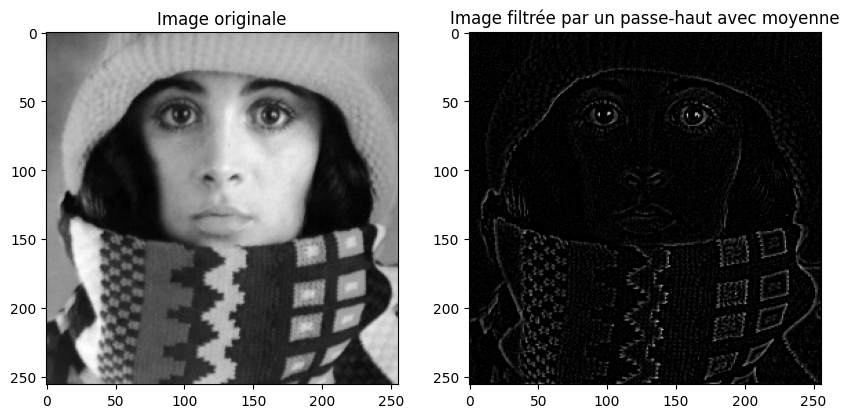

In [39]:
contours = cv.filter2D(A_gris, -1, Mph1)
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

axs[0].imshow(A_gris, cmap="gray")
axs[0].set_title("Image originale")

axs[1].imshow(contours, cmap="gray")
axs[1].set_title("Image filtrée par un passe-haut avec moyenne")

plt.show()

### - Sans moyenne

In [34]:
Mph1_sans_moy = (Mid - Mpb1)*9

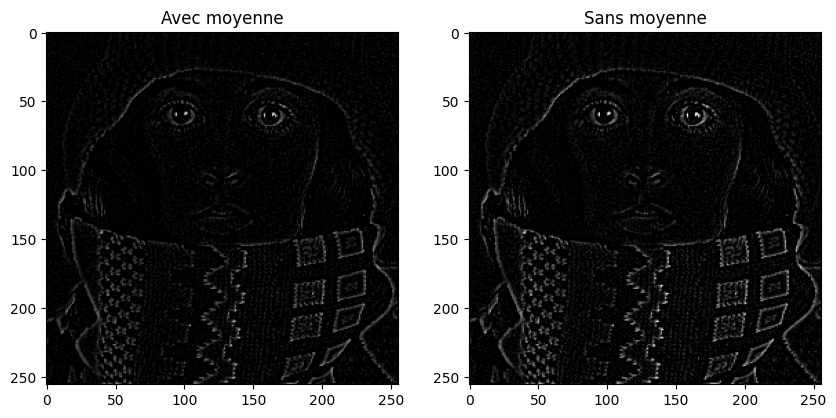

In [36]:
contours_non = cv.filter2D(A_gris, -1, Mph1_sans_moy)
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

axs[0].imshow(contours, cmap="gray")
axs[0].set_title("Avec moyenne")

axs[1].imshow(contours_non, cmap="gray")
axs[1].set_title("Sans moyenne")

plt.show()

### - En soustrayant la moyenne de l'image avant d'appliquer le filtre :

In [41]:
# Convert the image to floating-point format
A_gris_float = A_gris.astype(np.float64)

# Subtract the mean from the image
A_gris_float -= np.mean(A_gris_float)

# Convert the image back to uint8 format
A_gris = np.uint8(A_gris_float)

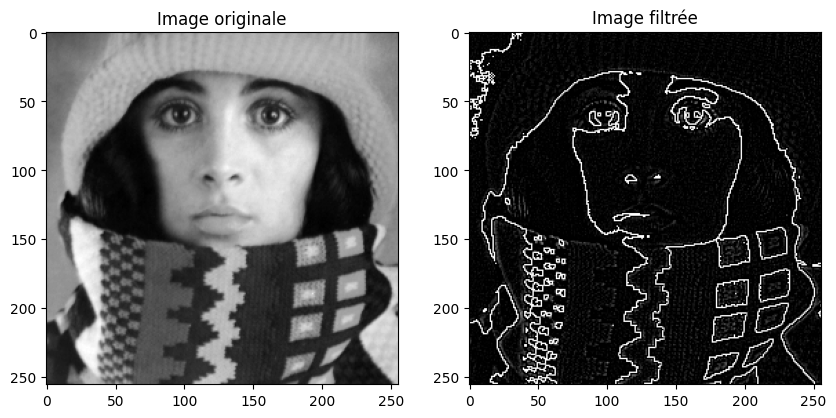

In [42]:
contours_sans_moy = cv.filter2D(A_gris, -1, Mph1*9)
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
A_gris = cv.cvtColor(A, cv.COLOR_BGR2GRAY)
axs[0].imshow(A_gris, cmap="gray")
axs[0].set_title("Image originale")

axs[1].imshow(contours_sans_moy, cmap="gray")
axs[1].set_title("Image filtrée")

plt.show()

### 5. Appliquer à A le filtre accentuateur.

$$Acc_1 = \begin{pmatrix}
  -1 & -1 & -1\\ 
  -1 & 9 & -1\\
  -1 & -1 & -1
\end{pmatrix}$$

In [46]:
accentuator_1 = np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]])

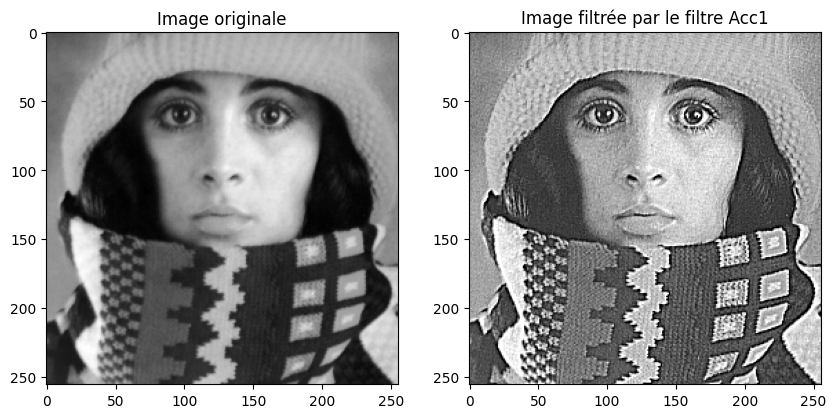

In [47]:
accentuated_1 = cv.filter2D(A_gris, -1, accentuator_1)
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

axs[0].imshow(A_gris, cmap="gray")
axs[0].set_title("Image originale")

axs[1].imshow(accentuated_1, cmap="gray")
axs[1].set_title("Image filtrée par le filtre Acc1")

plt.show()

$$Acc_2 = \begin{pmatrix}
  -1 & -2 & -1\\ 
  -2 & 13 & -2\\
  -1 & -2 & -1
\end{pmatrix}$$

In [48]:
accentuator_2 = np.array([[-1, -2, -1], [-2, 13, -2], [-1, -2, -1]])

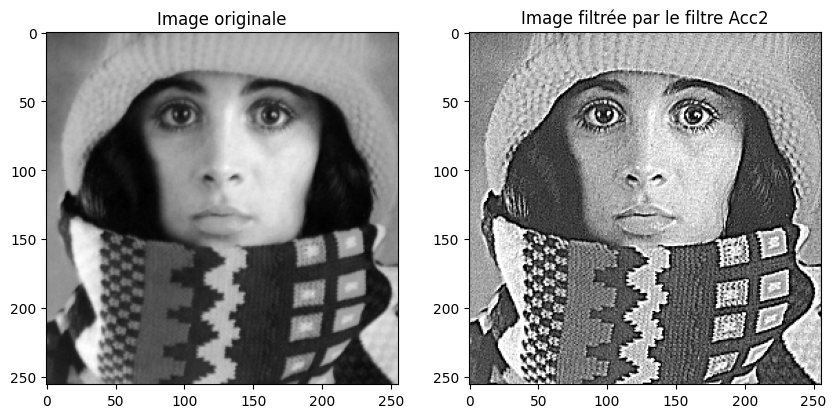

In [49]:
accentuated_2 = cv.filter2D(A_gris, -1, accentuator_2)
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

axs[0].imshow(A_gris, cmap="gray")
axs[0].set_title("Image originale")

axs[1].imshow(accentuated_2, cmap="gray")
axs[1].set_title("Image filtrée par le filtre Acc2")

plt.show()

## 6. Appliquer à A une érosion seule en utilisant un élément structurant autre qu’une fenêtre 3x3 (disque). Refaire le travail avec la dilatation.

### - Taille de la fenêtre : 3

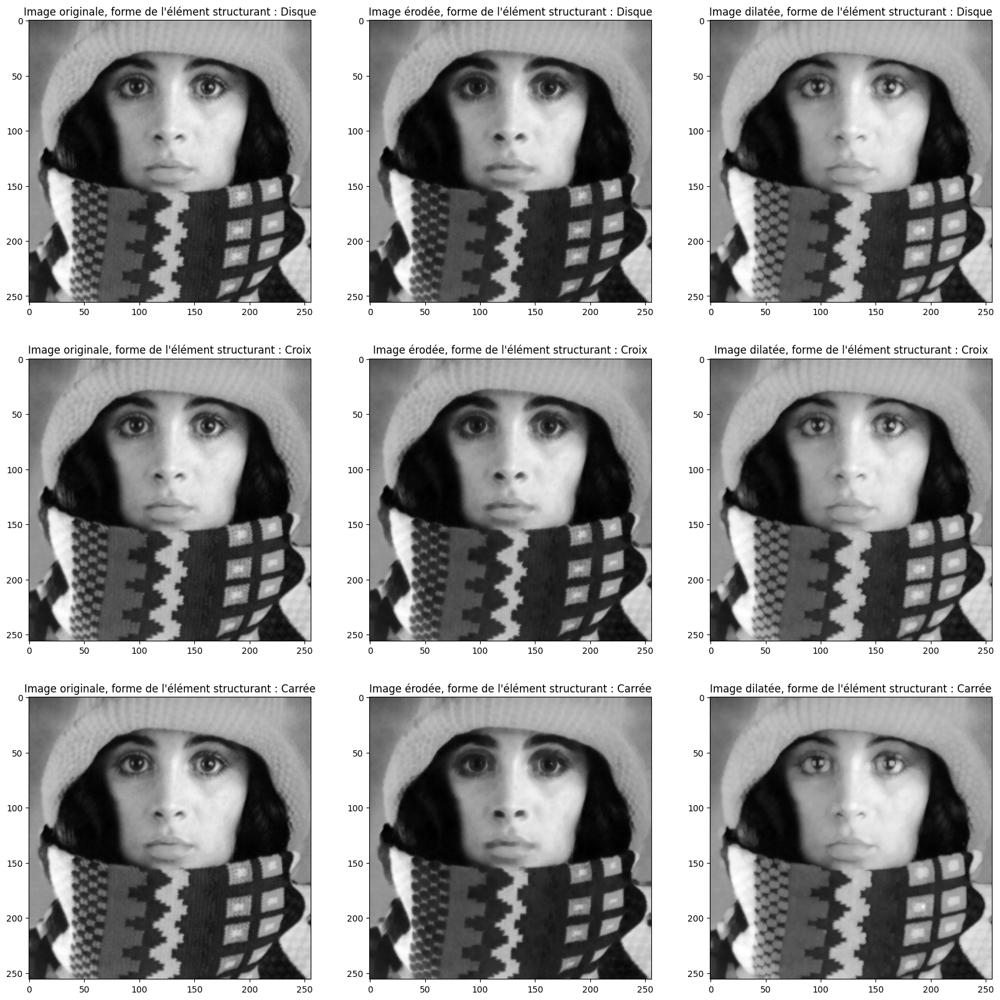

In [55]:
A_gris = cv.cvtColor(A, cv.COLOR_BGR2GRAY)

# create subplots
fig, axs = plt.subplots(3, 3, figsize=(20, 20))

shapes = [cv.MORPH_ELLIPSE, cv.MORPH_CROSS, cv.MORPH_RECT]
shape_names = ["Disque","Croix","Carrée"]

for i, shape in enumerate(shapes):
	element_structurant = cv.getStructuringElement(shape, (3, 3))
	erodee = cv.erode(A_gris, element_structurant)
	dilatee = cv.dilate(A_gris, element_structurant)

	# display the original and filtered images
	axs[i, 0].imshow(A_gris, cmap="gray")
	axs[i, 0].set_title("Image originale, forme de l'élément structurant : "+shape_names[i])
    
	axs[i, 1].imshow(erodee, cmap="gray")
	axs[i, 1].set_title("Image érodée, forme de l'élément structurant : "+shape_names[i])
    
	axs[i, 2].imshow(dilatee, cmap="gray")
	axs[i, 2].set_title("Image dilatée, forme de l'élément structurant : "+shape_names[i])
    
plt.show()

### - Taille de la fenêtre : 5

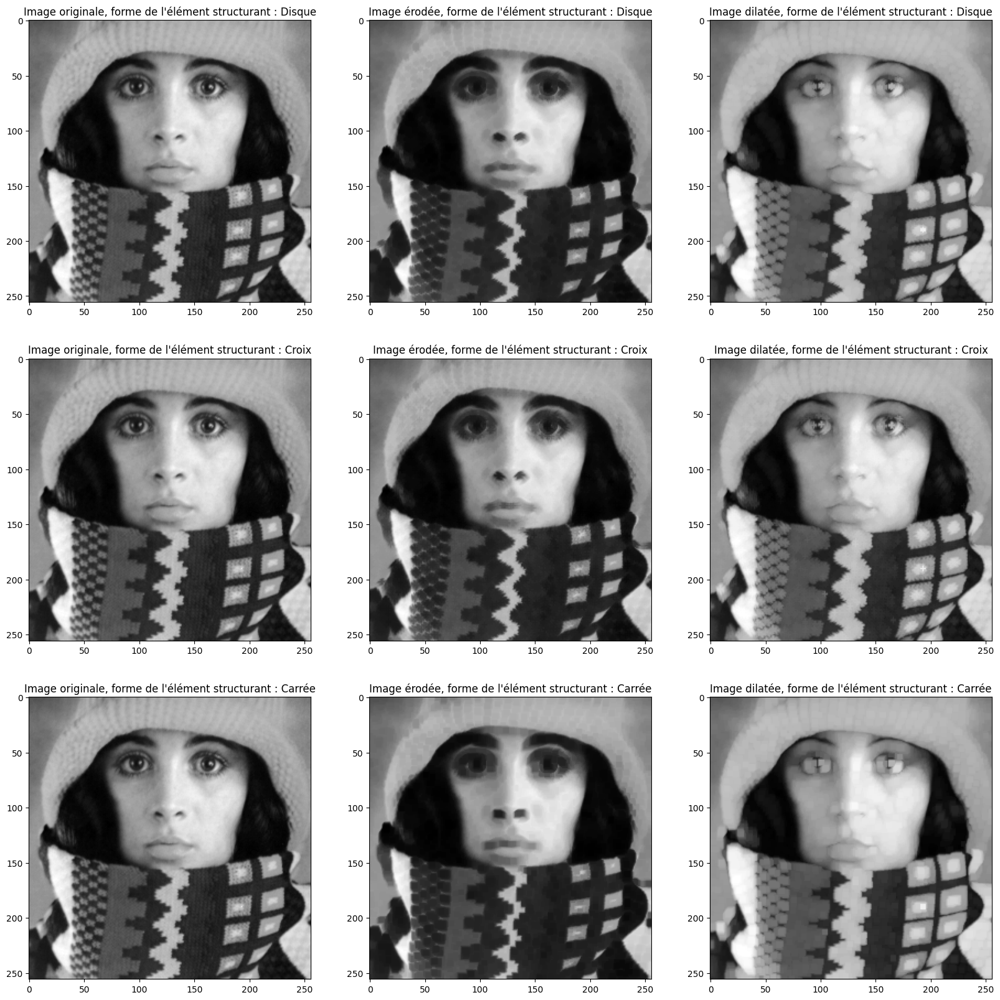

In [56]:
A_gris = cv.cvtColor(A, cv.COLOR_BGR2GRAY)

# create subplots
fig, axs = plt.subplots(3, 3, figsize=(20, 20))

shapes = [cv.MORPH_ELLIPSE, cv.MORPH_CROSS, cv.MORPH_RECT]
shape_names = ["Disque","Croix","Carrée"]

for i, shape in enumerate(shapes):
	element_structurant = cv.getStructuringElement(shape, (5, 5))
	erodee = cv.erode(A_gris, element_structurant)
	dilatee = cv.dilate(A_gris, element_structurant)

	# display the original and filtered images
	axs[i, 0].imshow(A_gris, cmap="gray")
	axs[i, 0].set_title("Image originale, forme de l'élément structurant : "+shape_names[i])
    
	axs[i, 1].imshow(erodee, cmap="gray")
	axs[i, 1].set_title("Image érodée, forme de l'élément structurant : "+shape_names[i])
    
	axs[i, 2].imshow(dilatee, cmap="gray")
	axs[i, 2].set_title("Image dilatée, forme de l'élément structurant : "+shape_names[i])

plt.show()

### - Taille de la fenêtre : 10

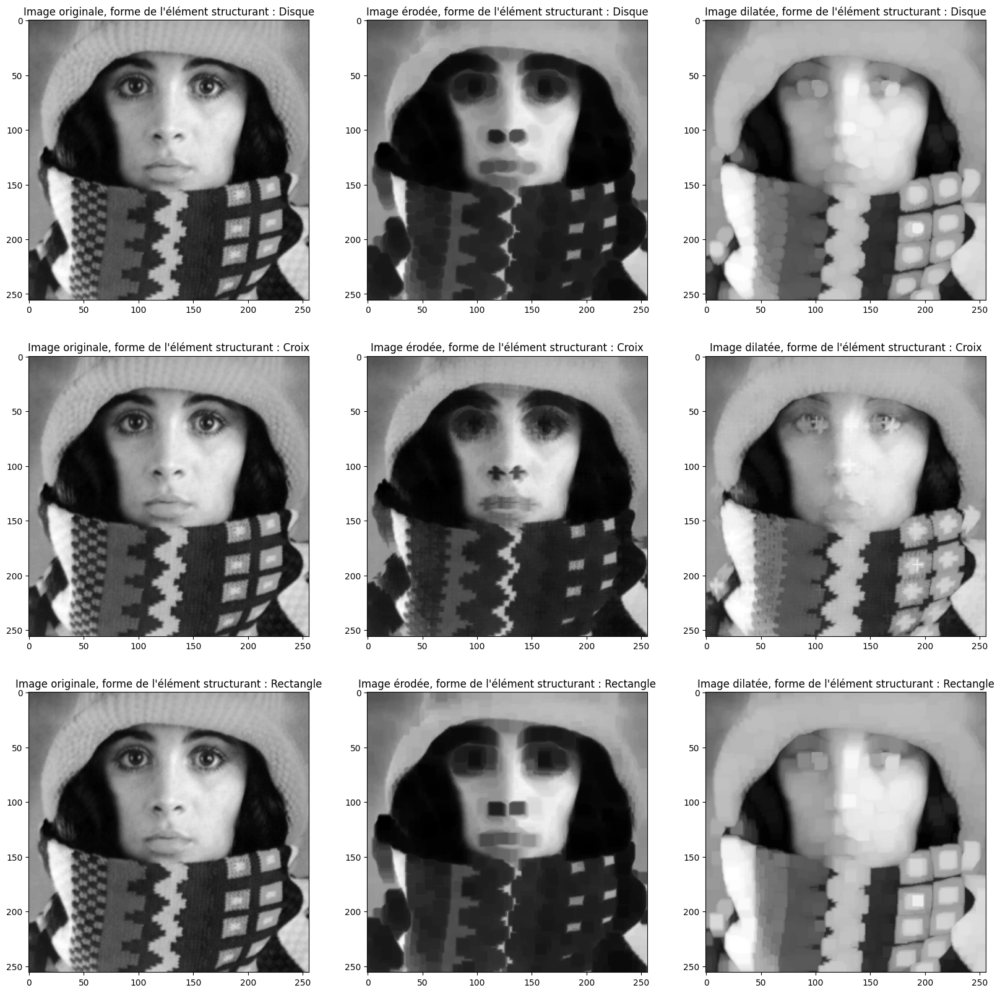

In [54]:
A_gris = cv.cvtColor(A, cv.COLOR_BGR2GRAY)

# create subplots
fig, axs = plt.subplots(3, 3, figsize=(20, 20))

shapes = [cv.MORPH_ELLIPSE, cv.MORPH_CROSS, cv.MORPH_RECT]
shape_names = ["Disque","Croix","Rectangle"]

for i, shape in enumerate(shapes):
	element_structurant = cv.getStructuringElement(shape, (10, 10))
	erodee = cv.erode(A_gris, element_structurant)
	dilatee = cv.dilate(A_gris, element_structurant)

	# display the original and filtered images
	axs[i, 0].imshow(A_gris, cmap="gray")
	axs[i, 0].set_title("Image originale, forme de l'élément structurant : "+shape_names[i])
    
	axs[i, 1].imshow(erodee, cmap="gray")
	axs[i, 1].set_title("Image érodée, forme de l'élément structurant : "+shape_names[i])
    
	axs[i, 2].imshow(dilatee, cmap="gray")
	axs[i, 2].set_title("Image dilatée, forme de l'élément structurant : "+shape_names[i])

plt.show()